# Steps to predict test image part masks

### Prepare environment for prediction

 - Import necessary modules: `sys` and `os`.
 - Define the project's main directory and append it to `sys.path`

In [15]:
import sys
import os

project_main_dir = os.path.abspath('..')
# Add the project's main directory to sys.path
if project_main_dir not in sys.path:
    sys.path.append(project_main_dir)
os.chdir(project_main_dir)

##### import necessary classes

In [16]:
from src.utils.config import InferenceConfig
from src.utils.data_utils import load_concept_hierarchy
from src.utils.gpt_utils import filter_relevant_parts_through_api
from src.inference.image_loader import ImageLoader
from src.inference.classifier import PartClassifier
from src.inference.visualization import MaskVisualizer

##### Initialize the PartClassifier, ImageLoader, and MaskVisualizer

In [17]:
# Note: You can also pass custom configuration to InferenceConfig class
# Example: config = InferenceConfig(input_dir='test_images/', output_dir='output/', threshold=0.5)
config = InferenceConfig(checkpoint_dir = "/shared/nas/data/m1/elenc2/PartClassification/checkpoints_vitl14_last",
                         input_dir = 'data/all_test_images')
part_classifier = PartClassifier(config)
visualizer = MaskVisualizer(config)
image_loader = ImageLoader(config)

Using cache found in /home/elenc2/.cache/torch/hub/facebookresearch_dinov2_main


### Write to csv

In [26]:
concept_parts = load_concept_hierarchy(f"{config.checkpoint_dir}/concept_hierarchy.pkl")
concepts_with_parts = {}

# Iterate over the items in the given dictionary
for key, parts in concept_parts.items():
    # Split the key to extract the root concept and individual concept
    root_concept, concept = key.split('--')
    
    # Initialize the root concept if it doesn't exist
    if root_concept not in concepts_with_parts:
        concepts_with_parts[root_concept] = {
            "# of concepts": 0,
            "concepts": {}
        }
    
    # Add the concept and its parts to the root concept
    concepts_with_parts[root_concept]["concepts"][concept] = parts
    # Increment the count of concepts for the root concept
    concepts_with_parts[root_concept]["# of concepts"] += 1

Concept hierarchy loaded from /shared/nas/data/m1/elenc2/PartClassification/checkpoints_vitl14_last/concept_hierarchy.pkl


In [28]:
import csv

def write_to_csv(data, filename="output333.csv"):
    '''
    Write the data to a CSV file
    data should be a dictionary with the following structure:
    {
        "root_concept1": {
            "# of concepts": 2,
            "concepts": {
                "concept1": ["part1", "part2"],
                "concept2": ["part3", "part4"]
            }
        },
        "root_concept2": {
            "# of concepts": 1,
            "concepts": {
                "concept3": ["part5", "part6"]
            }
        }
    }
    '''
    with open(filename, mode="w", newline="", encoding="utf-8") as file:
        writer = csv.writer(file)
        writer.writerow(["Concept name", "Parts"])

        for root_concept, _ in data.items():
            # Write the root concept as a header
            print(f"Root concept: {root_concept}")
            writer.writerow([f"{root_concept} has {data[root_concept]["# of concepts"]} concepts", ""])

            for concept, parts in data[root_concept]["concepts"].items():
                tab_separated_part_values = ', '.join([part for part in parts])
                writer.writerow([concept, tab_separated_part_values])
        
            writer.writerow(["", ""])

# concept_parts = load_concept_hierarchy(f"{config.checkpoint_dir}/concept_hierarchy.pkl")
write_to_csv(concepts_with_parts, "/shared/nas/data/m1/elenc2/PartClassification/Concept_hierarchy-Nov27.csv")
print("CSV file created successfully!")

Root concept: boats
Root concept: office supplies
Root concept: kitchen
Root concept: helicopter
Root concept: tools
Root concept: geography
Root concept: garden
Root concept: vehicles
Root concept: weapons
Root concept: drones
Root concept: ships
Root concept: geometry
Root concept: airplanes
CSV file created successfully!


# GPT API integration

#### Setting up API for requests to openAI


In [ ]:
# pip install openai
from openai import OpenAI
from secret import KEY
client = OpenAI(api_key=KEY)

##### Example usage

In [ ]:
stream = client.chat.completions.create(
messages=[
    {
        "role": "user",
        "content": "Say hello in Armenian",
    }
],
model="gpt-4o-mini",
stream=True,
)
for chunk in stream:
    print(chunk.choices[0].delta.content or "", end="")
# RESPONSE-> Hello in Armenian is "Բարև" (barev).

Hello in Armenian is "Բարև" (barev).

##### definition, it is defined in the utils

In [ ]:
# def filter_relevant_parts_through_api(query_parts_string, new_concept, client):
#     # new_concept = "awl tool"
#     prompt_to_gpt = f"Which of the following parts are essential for identifying an {new_concept} specifically?\
#  Focus on parts that are visually distinctive and most critical to the {new_concept}'s function. Only select the parts that you would use to describe the {new_concept}.\
#  If multiple parts seem similar, select the one most specific to most instances of {new_concept} concept. Provide only those for which you are more than 90% sure.\
#  Provide the output only as a comma-separated list of those critical less than 8 parts.\n\
#     Parts: {{{query_parts_string}}}"

#     print("Prompt to GPT: ", prompt_to_gpt)
#     print(f"\n")
#     response = client.chat.completions.create(
#     messages=[
#         {
#             "role": "user",
#             "content": prompt_to_gpt,
#         }
#     ],
#     model="gpt-4o-mini",
#     stream=False
#     )
#     return response.choices[0].message.content
# example usage

#### filter_relevant_parts_through_api function usage

In [6]:
parts_to_consider = ['head', 'screwdriver', 'long arm', 'spring', 'handle', 'blade', 'point', 'grip', 'shaft', 'chisel']
parts_to_consider = ', '.join([s.replace("'", "") for s in parts_to_consider])
result = filter_relevant_parts_through_api(parts_to_consider, "awl tool", client)
print("API response: ", result)

Prompt to GPT:  Which of the following parts are essential for identifying an awl tool specifically? Focus on parts that are visually distinctive and most critical to the awl tool's function. Only select the parts that you would use to describe the awl tool. If multiple parts seem similar, select the one most specific to most instances of awl tool concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {head, screwdriver, long arm, spring, handle, blade, point, grip, shaft, chisel}


API response:  head, point, handle, shaft


# Load images and concept hiararchy

In [9]:
root_concepts = load_concept_hierarchy(f"{config.checkpoint_dir}/root_concept_hierarchy.pkl")
concept_parts = load_concept_hierarchy(f"{config.checkpoint_dir}/concept_hierarchy.pkl")

Concept hierarchy loaded from /shared/nas/data/m1/elenc2/PartClassification/checkpoints_vitl14_last/root_concept_hierarchy.pkl
Concept hierarchy loaded from /shared/nas/data/m1/elenc2/PartClassification/checkpoints_vitl14_last/concept_hierarchy.pkl


### Get the full list of concepts

In [10]:
all_concepts_lst = list(root_concepts.keys()) + list(concept_parts.keys())
print("root concepts length: ", len(list(root_concepts.keys())))
print("core concepts length: ", len(list(concept_parts.keys())))
print("All concepts length: ", len(all_concepts_lst))

root concepts length:  13
core concepts length:  539
All concepts length:  552


### LOAD L1 classifiers

In [11]:
# the default penalty is l1
part_classifier.load_part_classifiers(all_concepts_lst)
print(f"{len(part_classifier.classifers.keys())} L1 Part classifiers loaded successfully!")

Loading part classifiers: 100%|██████████| 552/552 [00:00<00:00, 1345.64it/s]

552 L1 Part classifiers loaded successfully!


### LOAD the L2 classifiers

In [14]:
config.penalty = 'l2'
part_classifier_l2 = PartClassifier(config)
part_classifier_l2.load_part_classifiers(all_concepts_lst)
print(f"{len(part_classifier.classifers.keys())} Part classifiers loaded successfully!")

# reset the penalty to l1
config.penalty = 'l1'

Loading part classifiers: 100%|██████████| 552/552 [00:00<00:00, 1531.37it/s]

552 Part classifiers loaded successfully!


In [13]:
#images_data is a dictionary with image names as keys and image data as values
images_data = image_loader.load_images()

/shared/nas/data/m1/elenc2/lib/conda/miniconda3/envs/db/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


#### The code below to shows how to use the classifiers for both new and existing concepts


Using classifier with penalty: l1
__________________________________________________________
__________________________________________________________
__________________________________________________________
Processing image: kitchen--ice cream maker-1.jpg
Concept name:  kitchen--ice cream maker
Prompt to GPT:  Which of the following parts are essential for identifying an ice cream maker specifically? Focus on parts that are visually distinctive and most critical to the ice cream maker's function. Only select the parts that you would use to describe the ice cream maker. If multiple parts seem similar, select the one most specific to most instances of ice cream maker concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {arm, base, insulated fabric, raised platform, thumb lever, motor housing, gear, cooking surface, pedestal, divider, rack, oven rack, basket handle, label, do

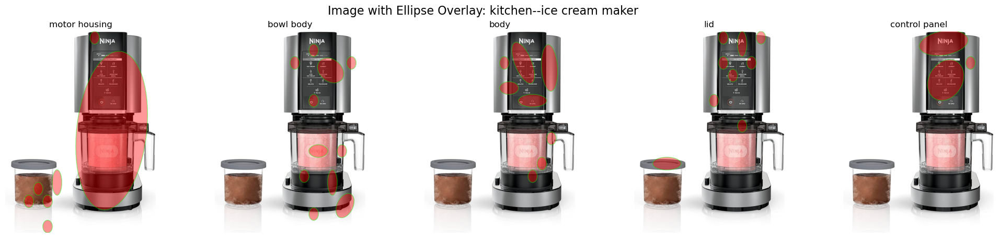

__________________________________________________________
Processing image: boats--banana boat-1.jpg
Concept name:  boats--banana boat
Concept boats : banana boat is in the concept parts


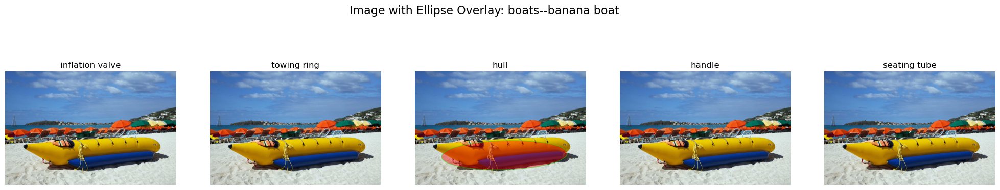

__________________________________________________________
Processing image: airplanes--supersonic passenger jet-1.jpg
Concept name:  airplanes--supersonic passenger jet
Prompt to GPT:  Which of the following parts are essential for identifying an supersonic passenger jet specifically? Focus on parts that are visually distinctive and most critical to the supersonic passenger jet's function. Only select the parts that you would use to describe the supersonic passenger jet. If multiple parts seem similar, select the one most specific to most instances of supersonic passenger jet concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {openable nose, propulsion component, cockpit, fixed landing gear, wings, glider wings, landing gear, row of windows, fire retardant}


Filtered masks:  dict_keys(['openable nose', 'propulsion component', 'wings', 'row of windows'])


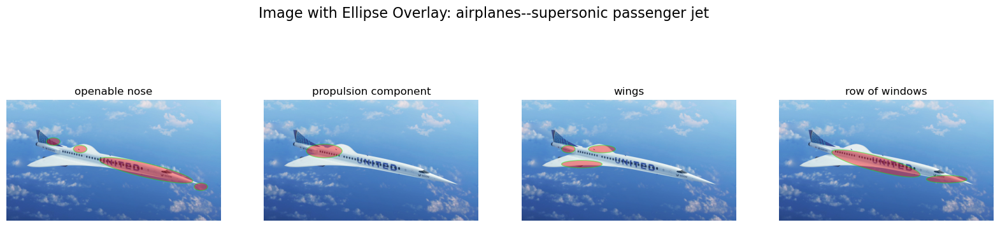

__________________________________________________________
Processing image: airplanes--agricultural-1.png
Concept name:  airplanes--agricultural
Concept airplanes : agricultural is in the concept parts


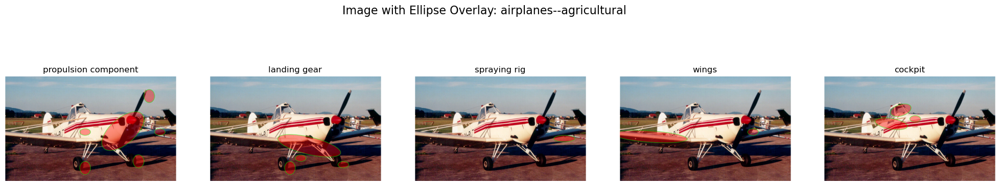

__________________________________________________________
Processing image: airplanes--private-2.png
Concept name:  airplanes--private
Concept airplanes : private is in the concept parts


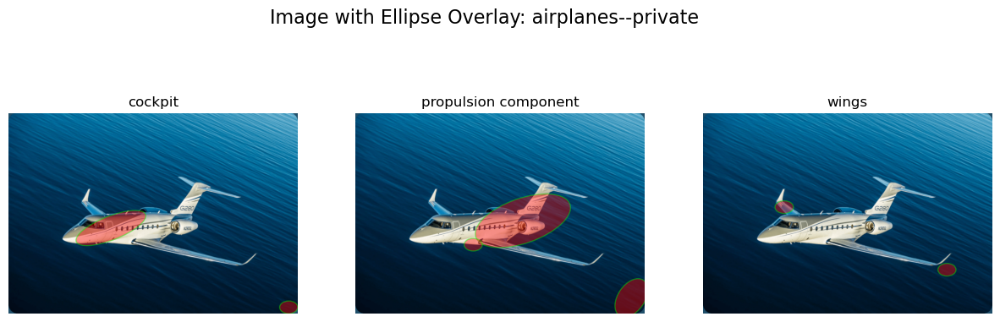

__________________________________________________________
Processing image: kitchen--bottle opener-1.jpg
Concept name:  kitchen--bottle opener
Concept kitchen : bottle opener is in the concept parts


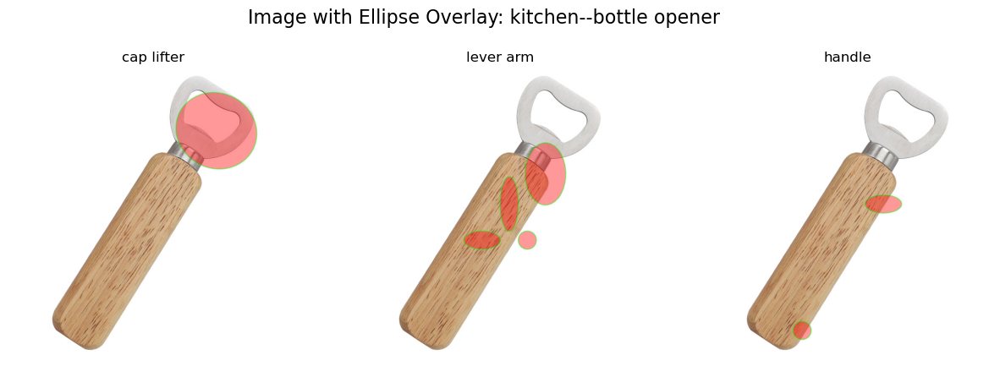

__________________________________________________________
Processing image: boats--destroyer-2.jpg
Concept name:  boats--destroyer
Concept boats : destroyer is in the concept parts


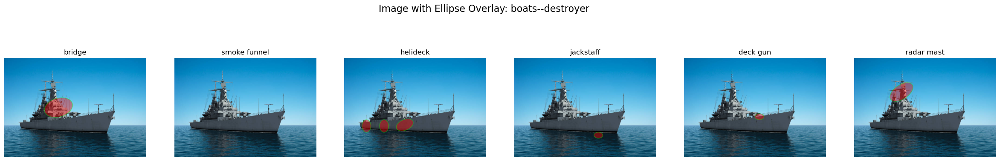

__________________________________________________________
Processing image: kitchen--garlic press-2.jpg
Concept name:  kitchen--garlic press
Prompt to GPT:  Which of the following parts are essential for identifying an garlic press specifically? Focus on parts that are visually distinctive and most critical to the garlic press's function. Only select the parts that you would use to describe the garlic press. If multiple parts seem similar, select the one most specific to most instances of garlic press concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {arm, base, wrist cuff, non slip surface, thumb lever, motor housing, gear, cooking surface, pedestal, cap, mouth, divider, rack, aluminum sheet, grip, oven rack, absorbent layer, compartment, foot ring, jar, door, bowl body, lever, cylindrical body, cavity, surface, carafe, holes, cap lifter, hanging hole, wire grid, control 

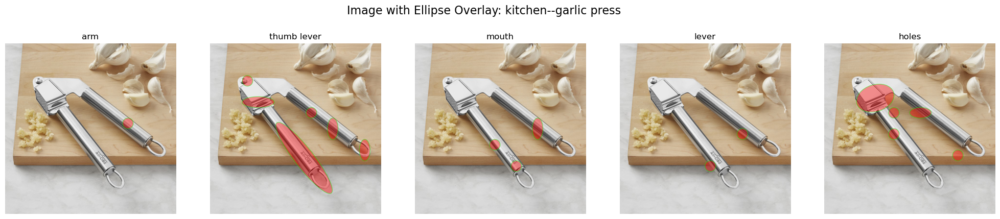

__________________________________________________________
Processing image: airplanes--agricultural-4.jpg
Concept name:  airplanes--agricultural
Concept airplanes : agricultural is in the concept parts


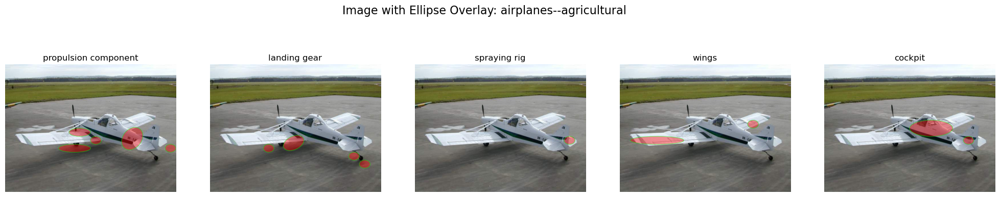

__________________________________________________________
Processing image: airplanes--attack-1.jpg
Concept name:  airplanes--attack
Concept airplanes : attack is in the concept parts


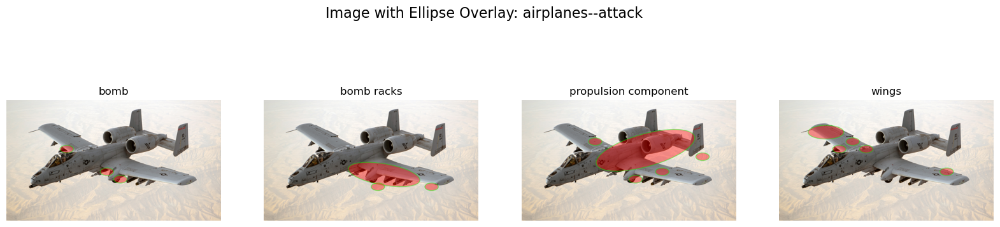

__________________________________________________________
Processing image: airplanes--agricultural-3.jpg
Concept name:  airplanes--agricultural
Concept airplanes : agricultural is in the concept parts


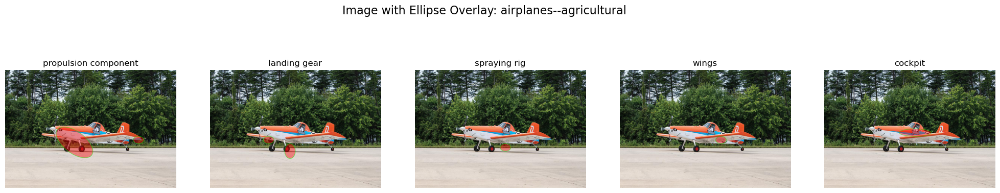

__________________________________________________________
Processing image: kitchen--espresso machine-1.jpg
Concept name:  kitchen--espresso machine
Concept kitchen : espresso machine is in the concept parts


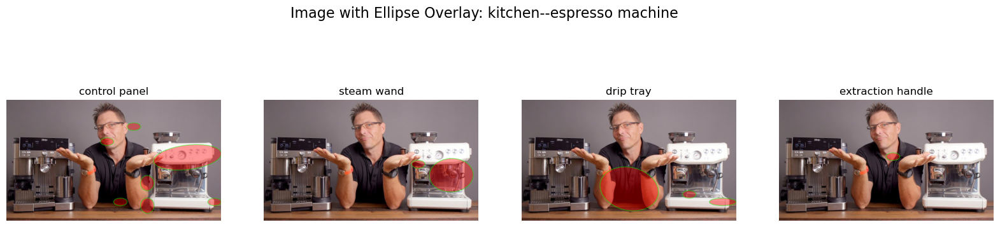

__________________________________________________________
Processing image: vehicles--suv-1.jpg
Concept name:  vehicles--suv
Concept vehicles : suv is in the concept parts


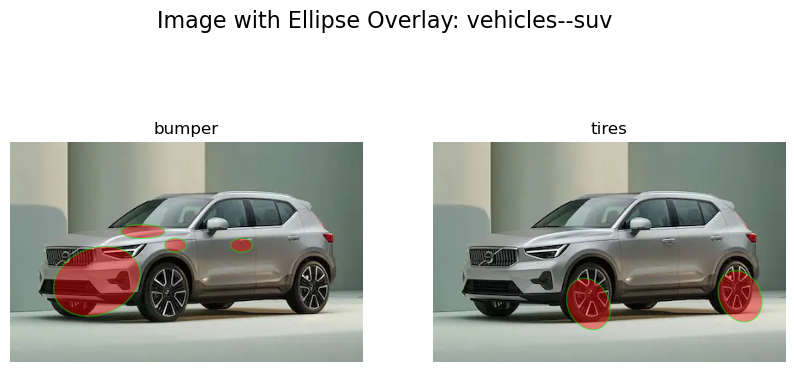

__________________________________________________________
Processing image: kitchen--spice rack-1.jpg
Concept name:  kitchen--spice rack
Prompt to GPT:  Which of the following parts are essential for identifying an spice rack specifically? Focus on parts that are visually distinctive and most critical to the spice rack's function. Only select the parts that you would use to describe the spice rack. If multiple parts seem similar, select the one most specific to most instances of spice rack concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {stick, base, insulated fabric, wrist cuff, non slip surface, thumb lever, motor housing, gear, cooking surface, pedestal, mouth, head, divider, rack, oven rack, basket handle, absorbent layer, label, prong, foot ring, jar, scoop bowl, bowl body, cylindrical body, cavity, neck, faucet, surface, carafe, holes, plate, nozzle, metal frame, w

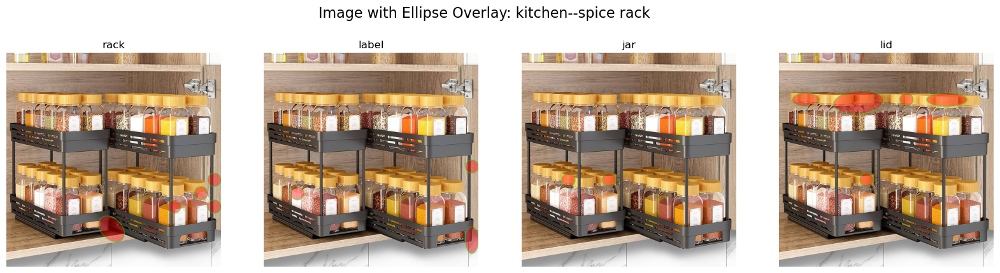

__________________________________________________________
Processing image: helicopter--helitanker-1.jpg
Concept name:  helicopter--helitanker
Concept helicopter : helitanker is in the concept parts


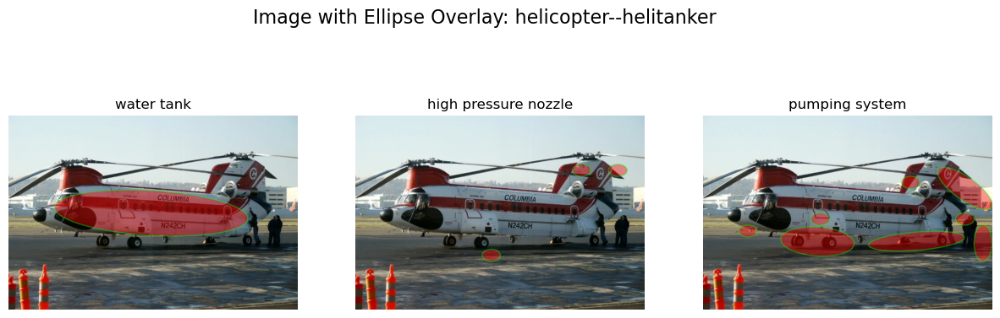

__________________________________________________________
Processing image: kitchen--pizza cutter-1.jpg
Concept name:  kitchen--pizza cutter
Concept kitchen : pizza cutter is in the concept parts


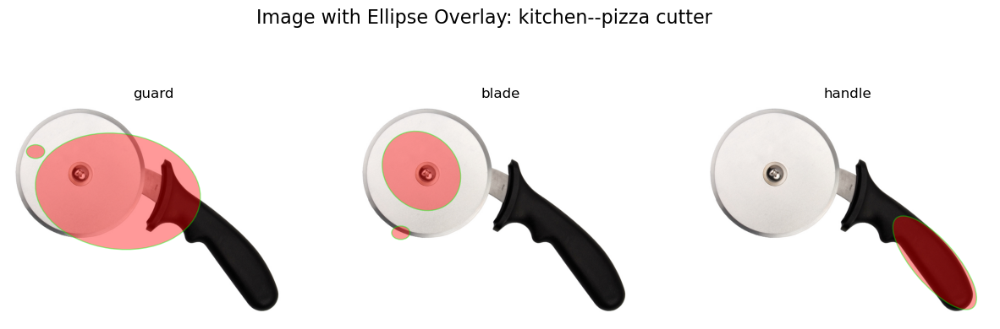

__________________________________________________________
Processing image: airplanes--agricultural-2.jpg
Concept name:  airplanes--agricultural
Concept airplanes : agricultural is in the concept parts


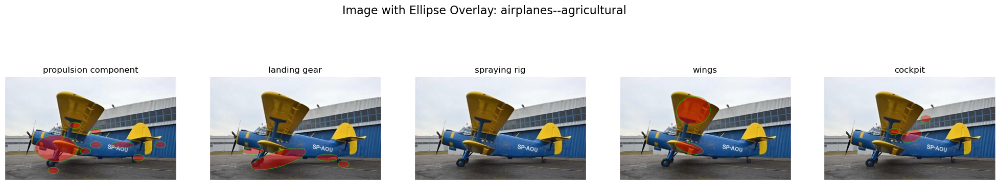

__________________________________________________________
Processing image: weapons--stone axe-1.jpg
Concept name:  weapons--stone axe
Prompt to GPT:  Which of the following parts are essential for identifying an stone axe specifically? Focus on parts that are visually distinctive and most critical to the stone axe's function. Only select the parts that you would use to describe the stone axe. If multiple parts seem similar, select the one most specific to most instances of stone axe concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {warhead, guard, blade, pressure plate, guidance system, magazine, launch tube, trigger, scope, head, shaft, body, leading edge, fuel tank, safety pin}


Filtered masks:  dict_keys(['blade', 'head', 'shaft', 'leading edge'])


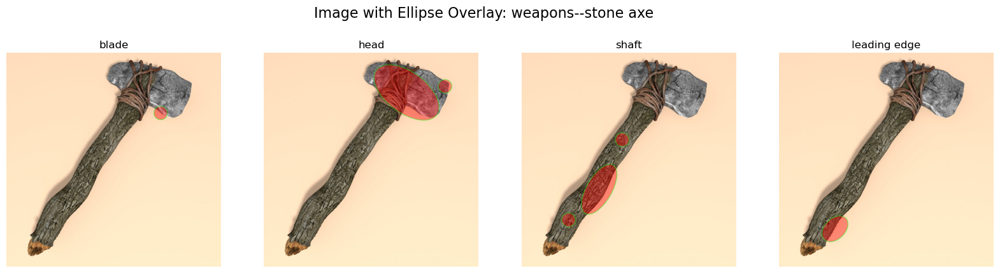

__________________________________________________________
Processing image: kitchen--espresso machine-3.png
Concept name:  kitchen--espresso machine
Concept kitchen : espresso machine is in the concept parts


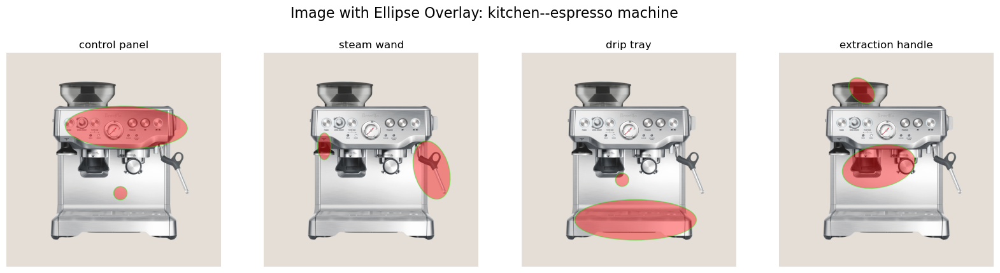

__________________________________________________________
Processing image: kitchen--air fryer-2.jpg
Concept name:  kitchen--air fryer
Concept kitchen : air fryer is in the concept parts


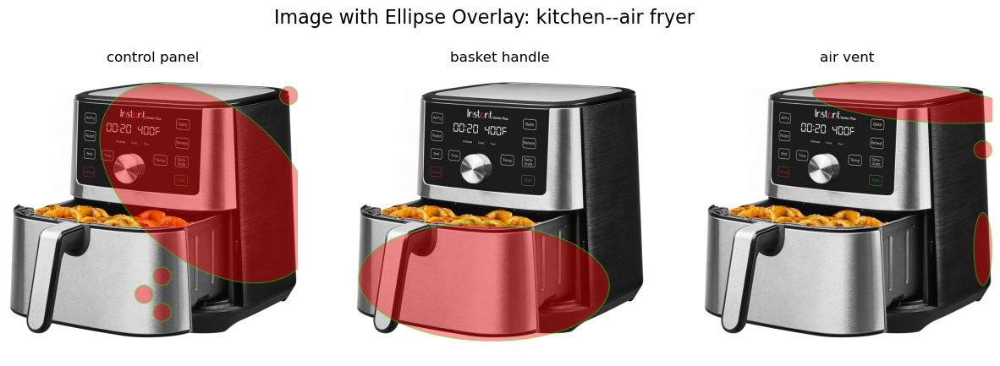

__________________________________________________________
Processing image: vehicles--hatch back-2.jpg
Concept name:  vehicles--hatch back
Concept vehicles : hatch back is in the concept parts


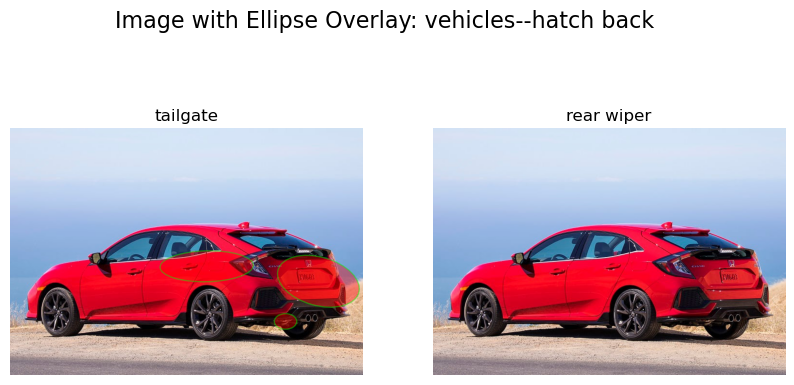

__________________________________________________________
Processing image: airplanes--private-10.JPG
Concept name:  airplanes--private
Concept airplanes : private is in the concept parts


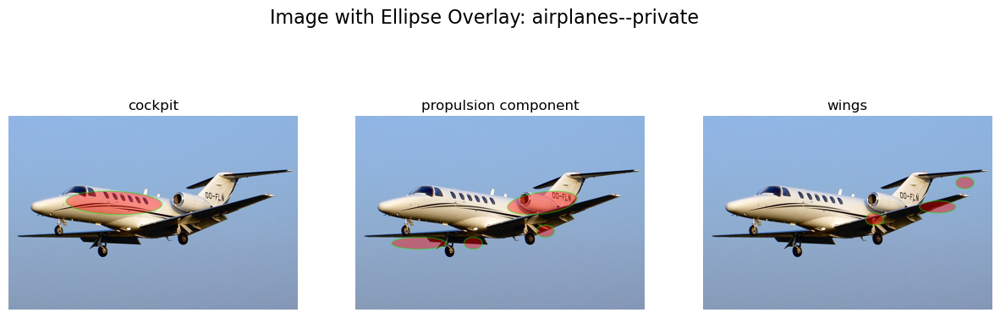

__________________________________________________________
Processing image: drones--combat-1.jpg
Concept name:  drones--combat
Concept drones : combat is in the concept parts


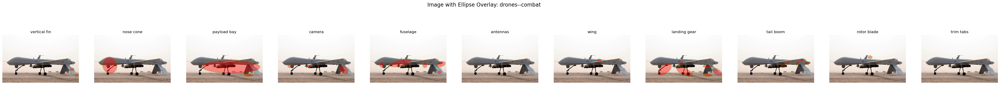

__________________________________________________________
Processing image: vehicles--hatch back-1.jpg
Concept name:  vehicles--hatch back
Concept vehicles : hatch back is in the concept parts


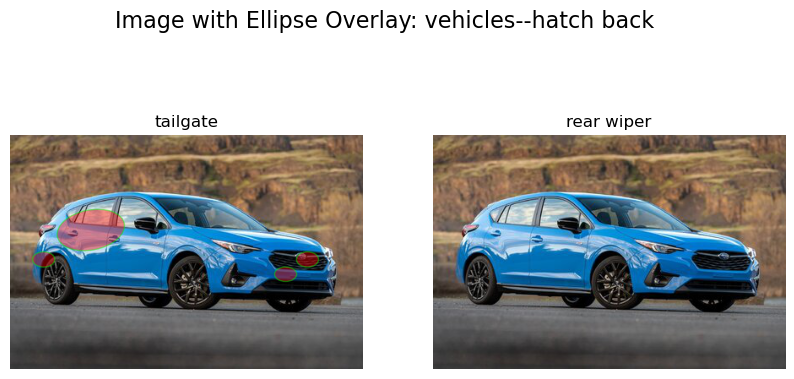

__________________________________________________________
Processing image: kitchen--air fryer-1.jpg
Concept name:  kitchen--air fryer
Concept kitchen : air fryer is in the concept parts


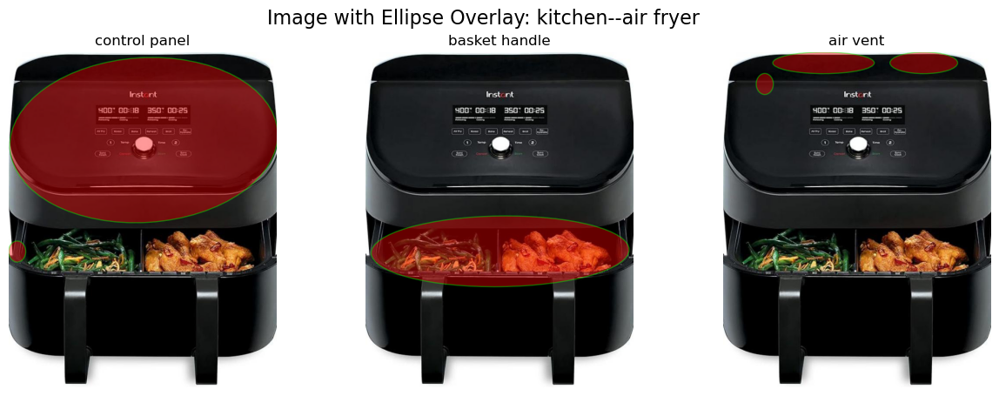

__________________________________________________________
Processing image: tools--awl-1.jpg
Concept name:  tools--awl
Prompt to GPT:  Which of the following parts are essential for identifying an awl specifically? Focus on parts that are visually distinctive and most critical to the awl's function. Only select the parts that you would use to describe the awl. If multiple parts seem similar, select the one most specific to most instances of awl concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {arm, tank, base, face, tweezers, ferrule, head, frame, table, tailstock, fence, spring, screwdriver, neck, box end, magazine, nozzle, crossbar, drum, corkscrew, shaft}


Filtered masks:  dict_keys(['ferrule', 'head', 'shaft'])


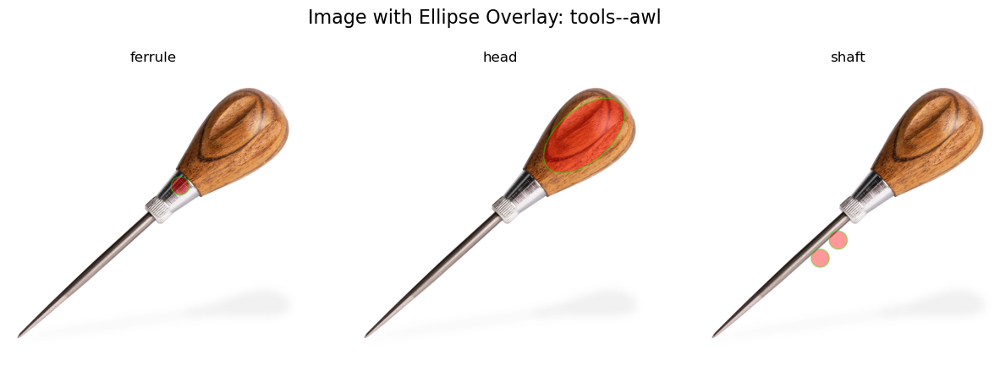

__________________________________________________________
Processing image: weapons--shotgun-1.jpg
Concept name:  weapons--shotgun
Prompt to GPT:  Which of the following parts are essential for identifying an shotgun specifically? Focus on parts that are visually distinctive and most critical to the shotgun's function. Only select the parts that you would use to describe the shotgun. If multiple parts seem similar, select the one most specific to most instances of shotgun concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {warhead, casing, guidance system, barrel, propulsion system, launch tube, trigger, head, body, grip, leading edge, fuel tank, stock}


Filtered masks:  dict_keys(['barrel', 'trigger', 'grip', 'stock'])


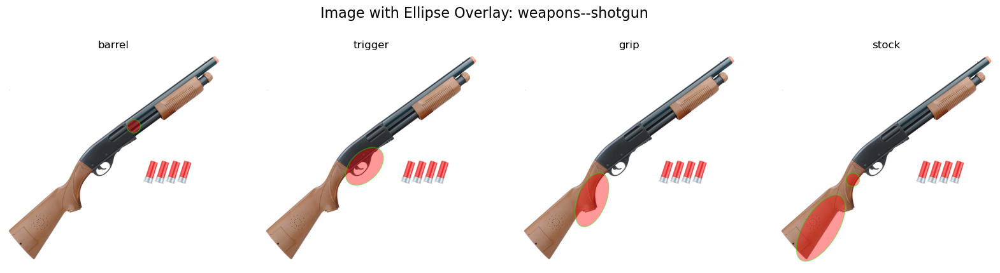

__________________________________________________________
Processing image: kitchen--espresso machine-2.jpg
Concept name:  kitchen--espresso machine
Concept kitchen : espresso machine is in the concept parts


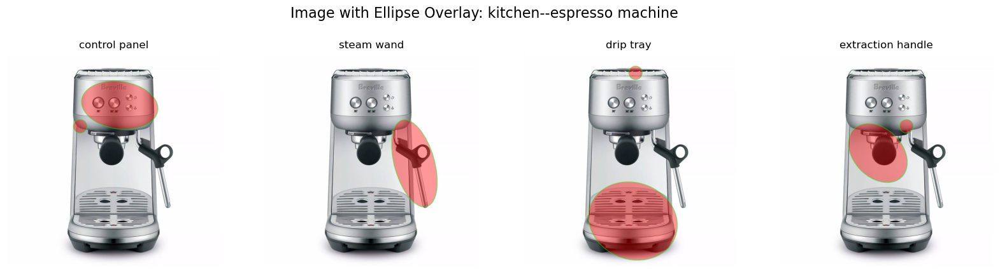

__________________________________________________________
Processing image: helicopter--helitanker-2.jpg
Concept name:  helicopter--helitanker
Concept helicopter : helitanker is in the concept parts


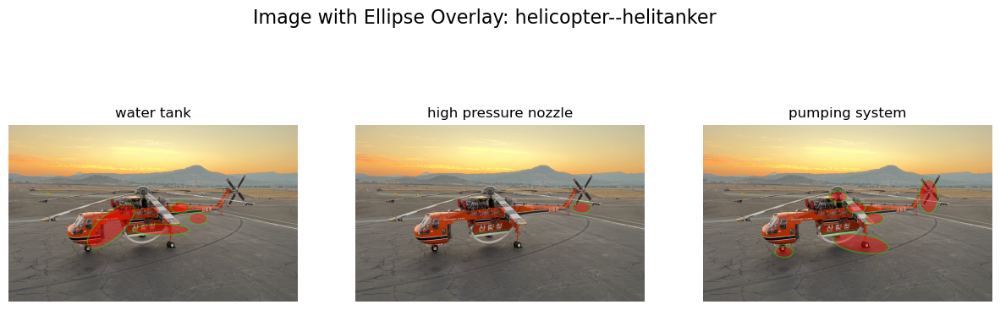

__________________________________________________________
Processing image: kitchen--peeler-1.jpg
Concept name:  kitchen--peeler
Concept kitchen : peeler is in the concept parts


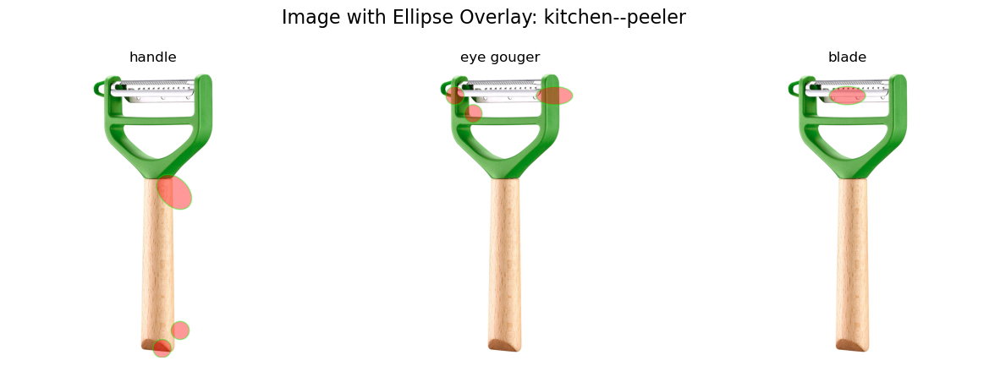

__________________________________________________________
Processing image: vehicles--suv-2.jpg
Concept name:  vehicles--suv
Concept vehicles : suv is in the concept parts


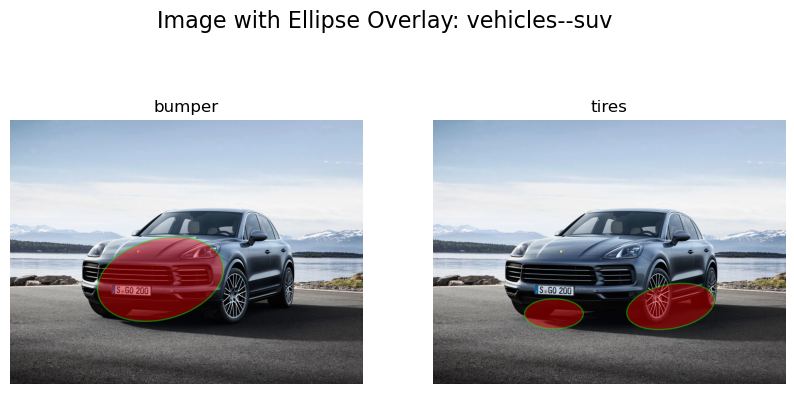

__________________________________________________________
Processing image: kitchen--garlic press-1.jpg
Concept name:  kitchen--garlic press
Prompt to GPT:  Which of the following parts are essential for identifying an garlic press specifically? Focus on parts that are visually distinctive and most critical to the garlic press's function. Only select the parts that you would use to describe the garlic press. If multiple parts seem similar, select the one most specific to most instances of garlic press concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {arm, mixing bowl, base, thumb lever, motor housing, gear, hose, cooking surface, pedestal, mouth, divider, rack, grating surface, aluminum sheet, oven rack, absorbent layer, label, compartment, prong, foot ring, jar, door, scoop bowl, bowl body, lever, cylindrical body, cavity, door handle, neck, surface, carafe, holes, cap l

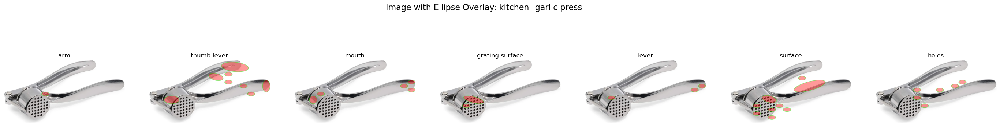

__________________________________________________________
Processing image: boats--destroyer-1.jpg
Concept name:  boats--destroyer
Concept boats : destroyer is in the concept parts


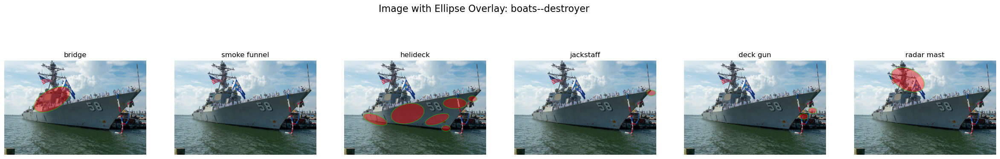

__________________________________________________________
Processing image: airplanes--attack-2.jpg
Concept name:  airplanes--attack
Concept airplanes : attack is in the concept parts


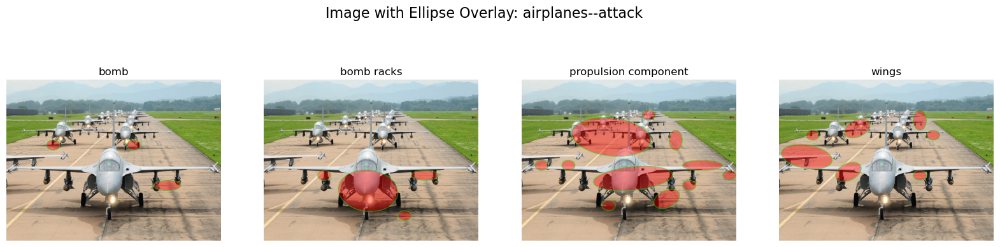

__________________________________________________________
Processing image: boats--banana boat-2.jpg
Concept name:  boats--banana boat
Concept boats : banana boat is in the concept parts


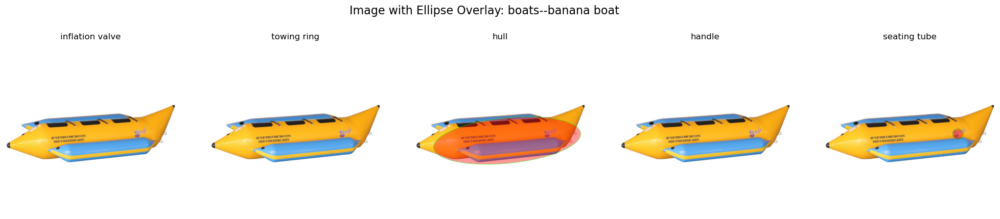

__________________________________________________________
Processing image: weapons--cruise missile-1.jpeg
Concept name:  weapons--cruise missile
Prompt to GPT:  Which of the following parts are essential for identifying an cruise missile specifically? Focus on parts that are visually distinctive and most critical to the cruise missile's function. Only select the parts that you would use to describe the cruise missile. If multiple parts seem similar, select the one most specific to most instances of cruise missile concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {pressure plate, guidance system, magazine, barrel, scabbard, launch tube, propeller, bolt, head, shaft, body, fuel tank, spine}


Filtered masks:  dict_keys(['guidance system', 'propeller', 'head', 'body', 'fuel tank'])


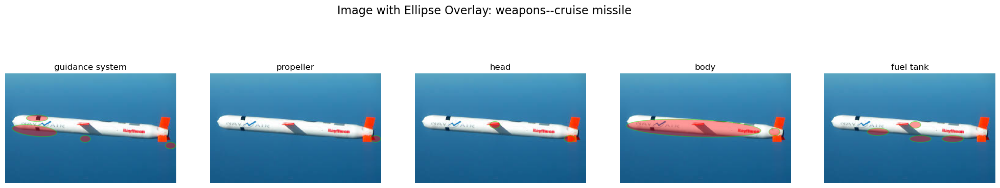

__________________________________________________________
Processing image: airplanes--supersonic passenger jet-2.jpg
Concept name:  airplanes--supersonic passenger jet
Prompt to GPT:  Which of the following parts are essential for identifying an supersonic passenger jet specifically? Focus on parts that are visually distinctive and most critical to the supersonic passenger jet's function. Only select the parts that you would use to describe the supersonic passenger jet. If multiple parts seem similar, select the one most specific to most instances of supersonic passenger jet concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {openable nose, propulsion component, fixed landing gear, wings, landing gear, row of windows, fire retardant}


Filtered masks:  dict_keys(['openable nose', 'propulsion component', 'wings', 'row of windows'])


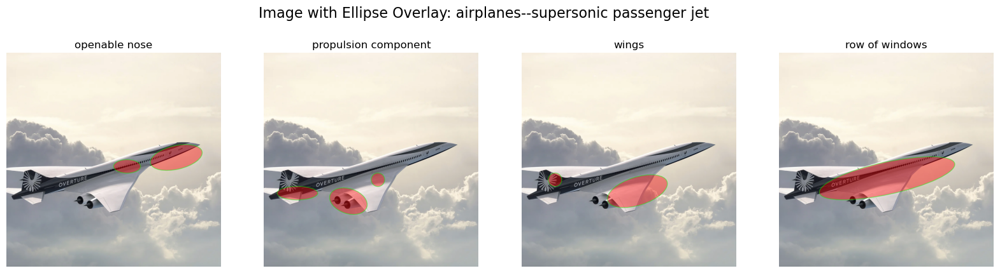

Using classifier with penalty: l2
__________________________________________________________
__________________________________________________________
__________________________________________________________
Processing image: kitchen--ice cream maker-1.jpg
Concept name:  kitchen--ice cream maker
Prompt to GPT:  Which of the following parts are essential for identifying an ice cream maker specifically? Focus on parts that are visually distinctive and most critical to the ice cream maker's function. Only select the parts that you would use to describe the ice cream maker. If multiple parts seem similar, select the one most specific to most instances of ice cream maker concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {arm, base, insulated fabric, raised platform, thumb lever, motor housing, gear, cooking surface, pedestal, divider, rack, oven rack, basket handle, label, do

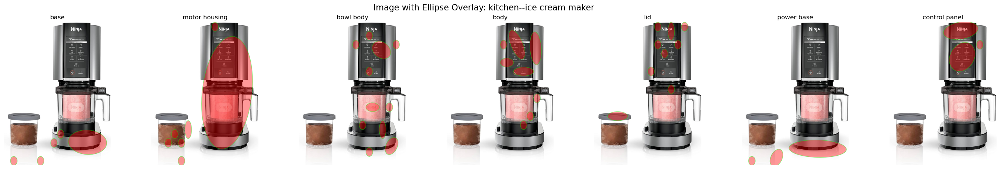

__________________________________________________________
Processing image: boats--banana boat-1.jpg
Concept name:  boats--banana boat
Concept boats : banana boat is in the concept parts


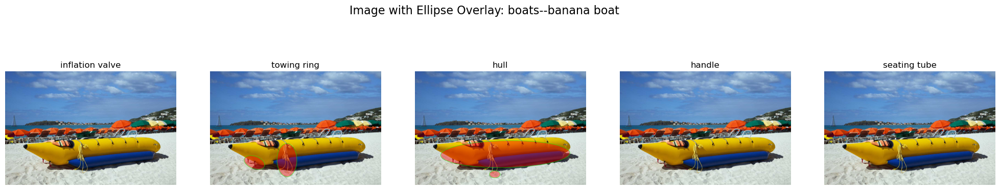

__________________________________________________________
Processing image: airplanes--supersonic passenger jet-1.jpg
Concept name:  airplanes--supersonic passenger jet
Prompt to GPT:  Which of the following parts are essential for identifying an supersonic passenger jet specifically? Focus on parts that are visually distinctive and most critical to the supersonic passenger jet's function. Only select the parts that you would use to describe the supersonic passenger jet. If multiple parts seem similar, select the one most specific to most instances of supersonic passenger jet concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {openable nose, propulsion component, cockpit, fixed landing gear, wings, glider wings, landing gear, row of windows, fire retardant}


Filtered masks:  dict_keys(['openable nose', 'propulsion component', 'wings', 'row of windows'])


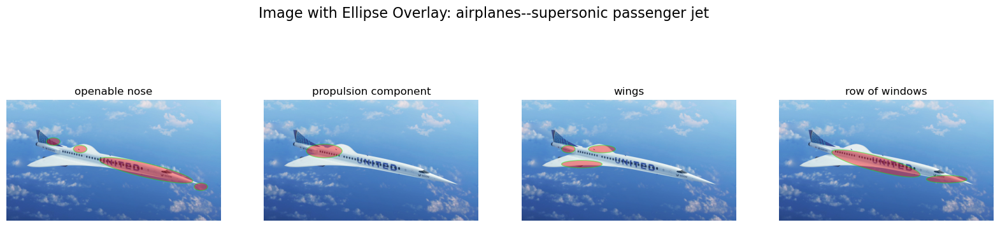

__________________________________________________________
Processing image: airplanes--agricultural-1.png
Concept name:  airplanes--agricultural
Concept airplanes : agricultural is in the concept parts


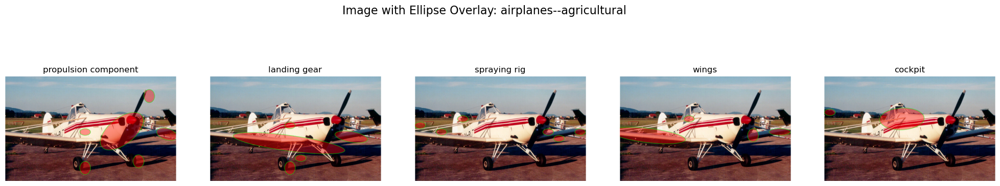

__________________________________________________________
Processing image: airplanes--private-2.png
Concept name:  airplanes--private
Concept airplanes : private is in the concept parts


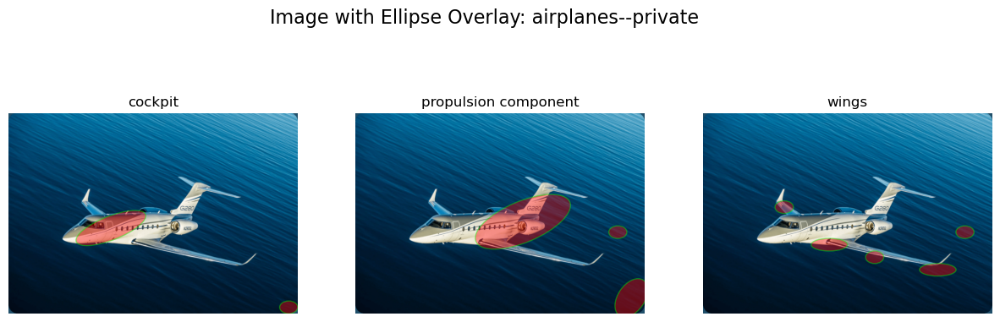

__________________________________________________________
Processing image: kitchen--bottle opener-1.jpg
Concept name:  kitchen--bottle opener
Concept kitchen : bottle opener is in the concept parts


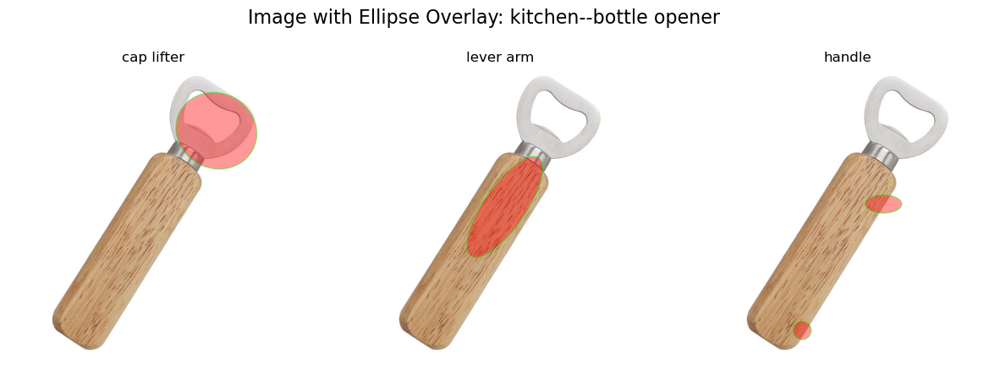

__________________________________________________________
Processing image: boats--destroyer-2.jpg
Concept name:  boats--destroyer
Concept boats : destroyer is in the concept parts


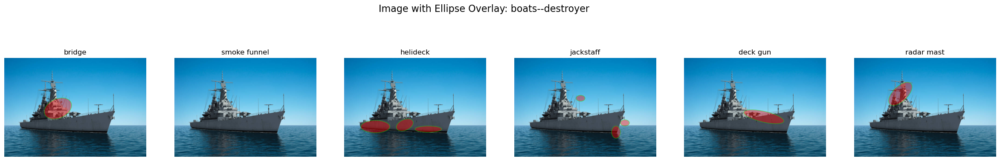

__________________________________________________________
Processing image: kitchen--garlic press-2.jpg
Concept name:  kitchen--garlic press
Prompt to GPT:  Which of the following parts are essential for identifying an garlic press specifically? Focus on parts that are visually distinctive and most critical to the garlic press's function. Only select the parts that you would use to describe the garlic press. If multiple parts seem similar, select the one most specific to most instances of garlic press concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {arm, base, wrist cuff, non slip surface, thumb lever, motor housing, gear, cooking surface, pedestal, cap, mouth, divider, rack, aluminum sheet, grip, oven rack, absorbent layer, compartment, foot ring, jar, door, bowl body, lever, cylindrical body, cavity, surface, carafe, holes, cap lifter, hanging hole, wire grid, control 

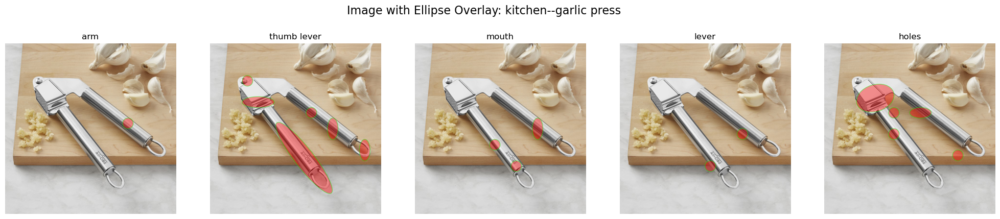

__________________________________________________________
Processing image: airplanes--agricultural-4.jpg
Concept name:  airplanes--agricultural
Concept airplanes : agricultural is in the concept parts


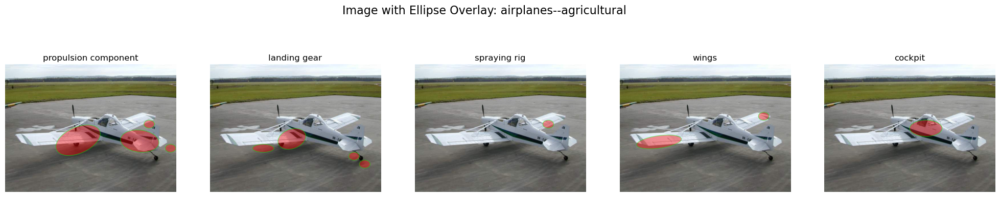

__________________________________________________________
Processing image: airplanes--attack-1.jpg
Concept name:  airplanes--attack
Concept airplanes : attack is in the concept parts


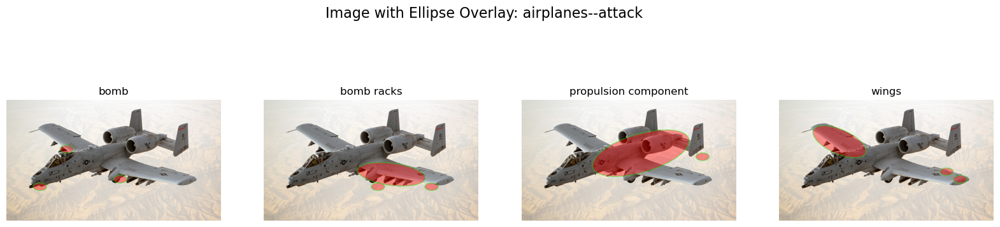

__________________________________________________________
Processing image: airplanes--agricultural-3.jpg
Concept name:  airplanes--agricultural
Concept airplanes : agricultural is in the concept parts


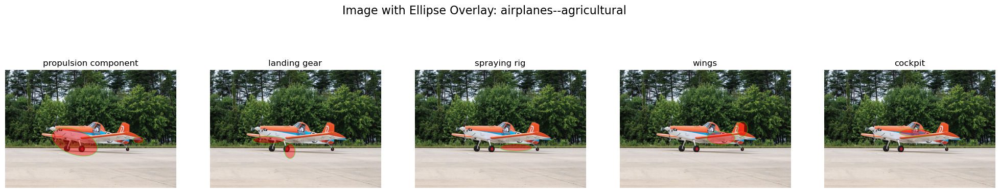

__________________________________________________________
Processing image: kitchen--espresso machine-1.jpg
Concept name:  kitchen--espresso machine
Concept kitchen : espresso machine is in the concept parts


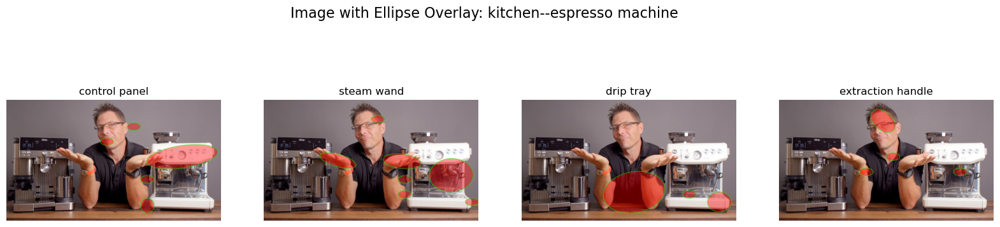

__________________________________________________________
Processing image: vehicles--suv-1.jpg
Concept name:  vehicles--suv
Concept vehicles : suv is in the concept parts


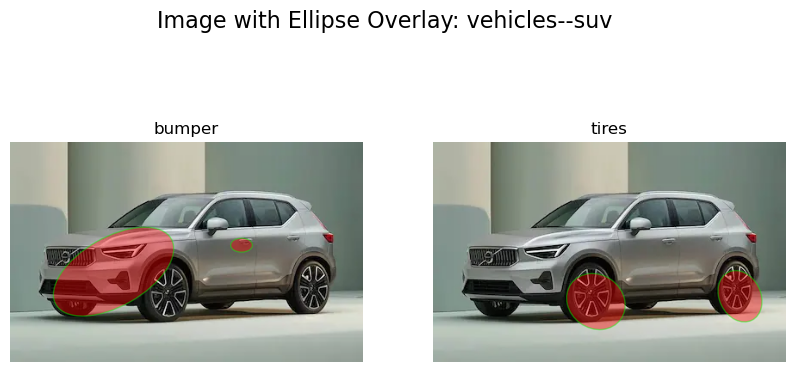

__________________________________________________________
Processing image: kitchen--spice rack-1.jpg
Concept name:  kitchen--spice rack
Prompt to GPT:  Which of the following parts are essential for identifying an spice rack specifically? Focus on parts that are visually distinctive and most critical to the spice rack's function. Only select the parts that you would use to describe the spice rack. If multiple parts seem similar, select the one most specific to most instances of spice rack concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {stick, base, insulated fabric, wrist cuff, non slip surface, thumb lever, motor housing, gear, cooking surface, pedestal, mouth, head, divider, rack, oven rack, basket handle, absorbent layer, label, prong, foot ring, jar, scoop bowl, bowl body, cylindrical body, cavity, neck, faucet, surface, carafe, holes, plate, nozzle, metal frame, w

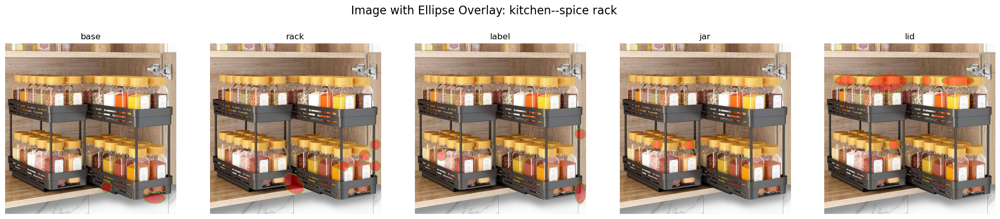

__________________________________________________________
Processing image: helicopter--helitanker-1.jpg
Concept name:  helicopter--helitanker
Concept helicopter : helitanker is in the concept parts


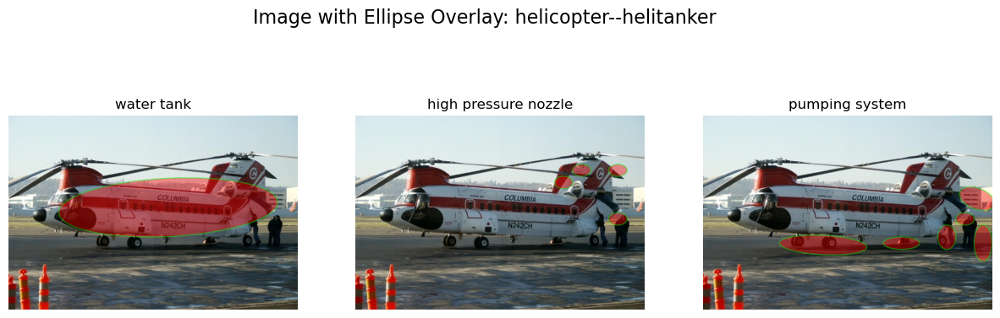

__________________________________________________________
Processing image: kitchen--pizza cutter-1.jpg
Concept name:  kitchen--pizza cutter
Concept kitchen : pizza cutter is in the concept parts


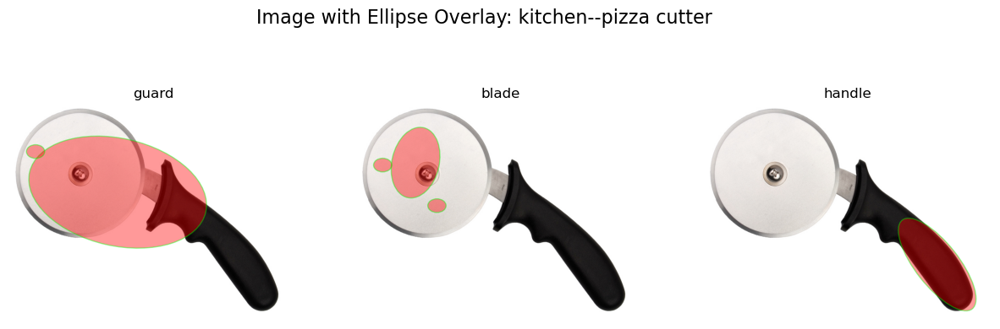

__________________________________________________________
Processing image: airplanes--agricultural-2.jpg
Concept name:  airplanes--agricultural
Concept airplanes : agricultural is in the concept parts


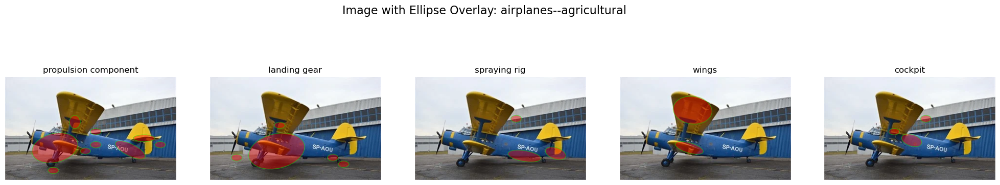

__________________________________________________________
Processing image: weapons--stone axe-1.jpg
Concept name:  weapons--stone axe
Prompt to GPT:  Which of the following parts are essential for identifying an stone axe specifically? Focus on parts that are visually distinctive and most critical to the stone axe's function. Only select the parts that you would use to describe the stone axe. If multiple parts seem similar, select the one most specific to most instances of stone axe concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {warhead, guard, blade, pressure plate, guidance system, magazine, launch tube, trigger, scope, head, shaft, body, leading edge, fuel tank, safety pin}


Filtered masks:  dict_keys(['blade', 'head', 'shaft'])


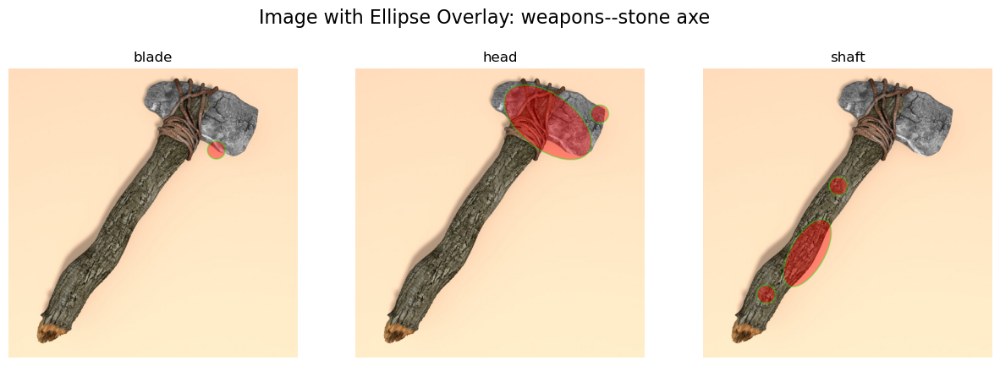

__________________________________________________________
Processing image: kitchen--espresso machine-3.png
Concept name:  kitchen--espresso machine
Concept kitchen : espresso machine is in the concept parts


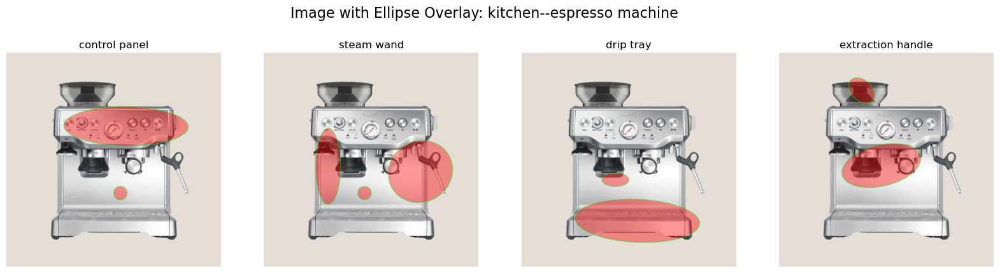

__________________________________________________________
Processing image: kitchen--air fryer-2.jpg
Concept name:  kitchen--air fryer
Concept kitchen : air fryer is in the concept parts


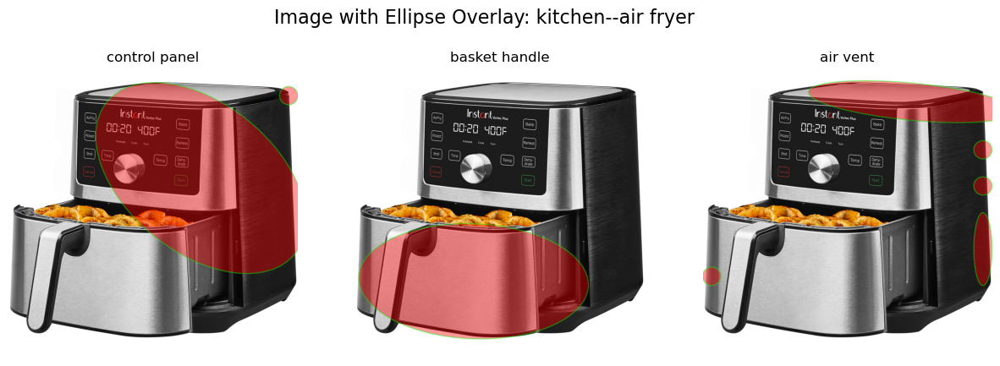

__________________________________________________________
Processing image: vehicles--hatch back-2.jpg
Concept name:  vehicles--hatch back
Concept vehicles : hatch back is in the concept parts


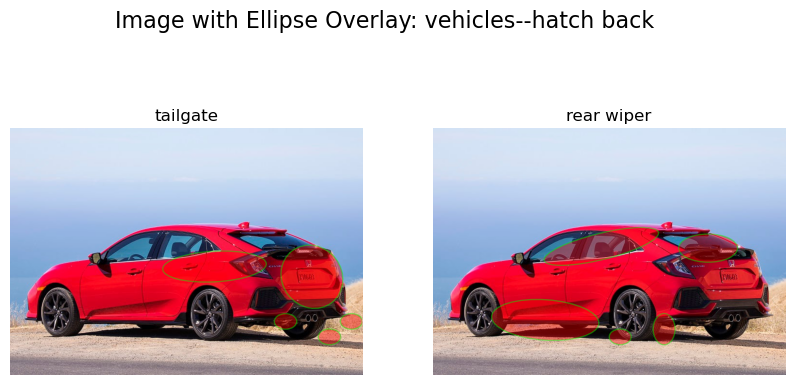

__________________________________________________________
Processing image: airplanes--private-10.JPG
Concept name:  airplanes--private
Concept airplanes : private is in the concept parts


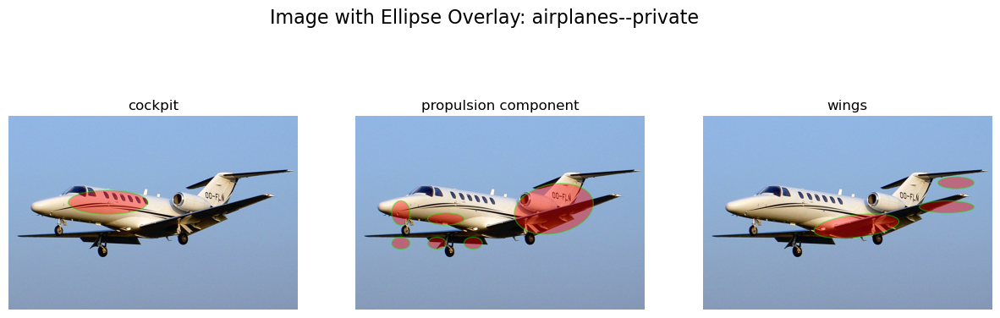

__________________________________________________________
Processing image: drones--combat-1.jpg
Concept name:  drones--combat
Concept drones : combat is in the concept parts


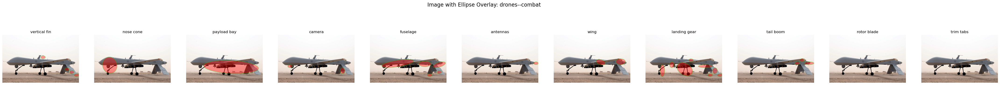

__________________________________________________________
Processing image: vehicles--hatch back-1.jpg
Concept name:  vehicles--hatch back
Concept vehicles : hatch back is in the concept parts


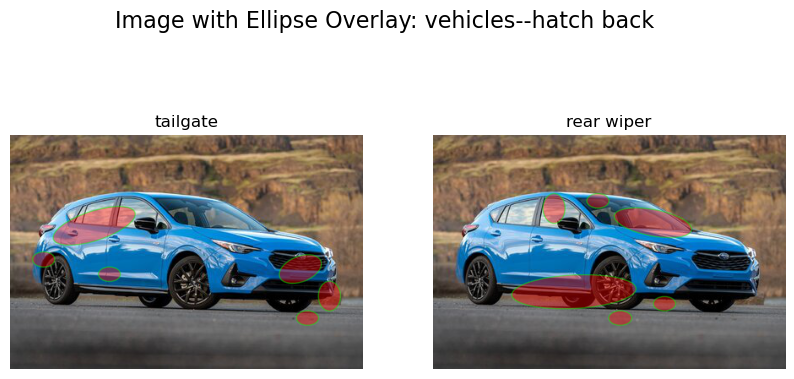

__________________________________________________________
Processing image: kitchen--air fryer-1.jpg
Concept name:  kitchen--air fryer
Concept kitchen : air fryer is in the concept parts


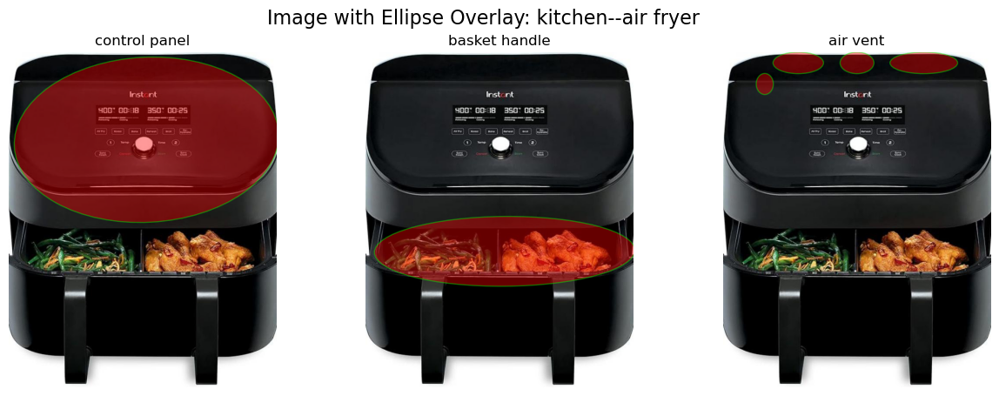

__________________________________________________________
Processing image: tools--awl-1.jpg
Concept name:  tools--awl
Prompt to GPT:  Which of the following parts are essential for identifying an awl specifically? Focus on parts that are visually distinctive and most critical to the awl's function. Only select the parts that you would use to describe the awl. If multiple parts seem similar, select the one most specific to most instances of awl concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {arm, tank, base, face, tweezers, ferrule, head, frame, table, tailstock, fence, spring, screwdriver, neck, box end, magazine, nozzle, crossbar, drum, corkscrew, shaft}


Filtered masks:  dict_keys(['ferrule', 'head', 'shaft'])


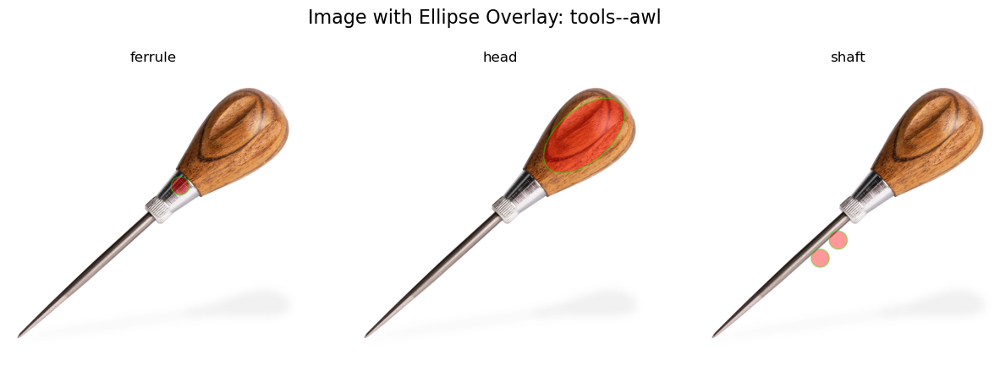

__________________________________________________________
Processing image: weapons--shotgun-1.jpg
Concept name:  weapons--shotgun
Prompt to GPT:  Which of the following parts are essential for identifying an shotgun specifically? Focus on parts that are visually distinctive and most critical to the shotgun's function. Only select the parts that you would use to describe the shotgun. If multiple parts seem similar, select the one most specific to most instances of shotgun concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {warhead, casing, guidance system, barrel, propulsion system, launch tube, trigger, head, body, grip, leading edge, fuel tank, stock}


Filtered masks:  dict_keys(['barrel', 'trigger', 'grip', 'stock'])


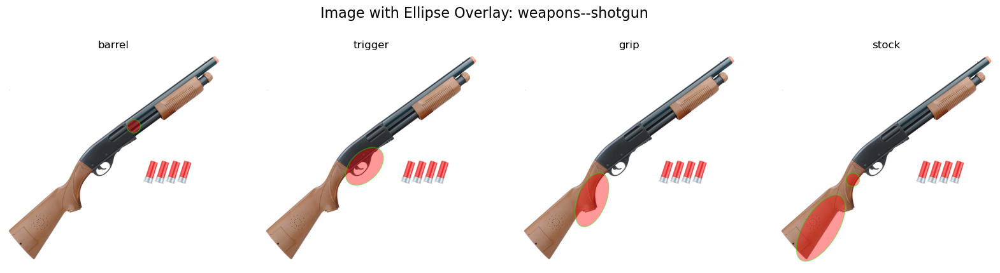

__________________________________________________________
Processing image: kitchen--espresso machine-2.jpg
Concept name:  kitchen--espresso machine
Concept kitchen : espresso machine is in the concept parts


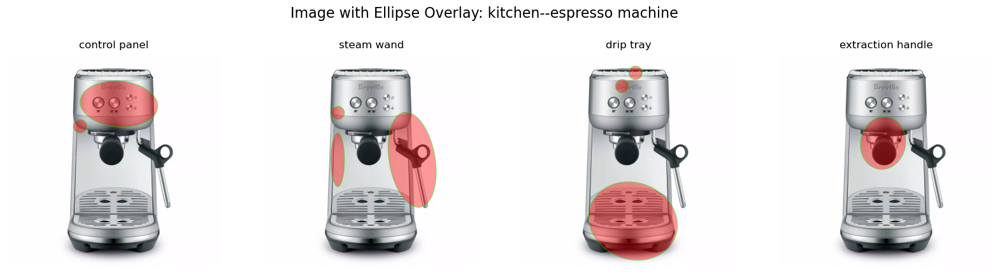

__________________________________________________________
Processing image: helicopter--helitanker-2.jpg
Concept name:  helicopter--helitanker
Concept helicopter : helitanker is in the concept parts


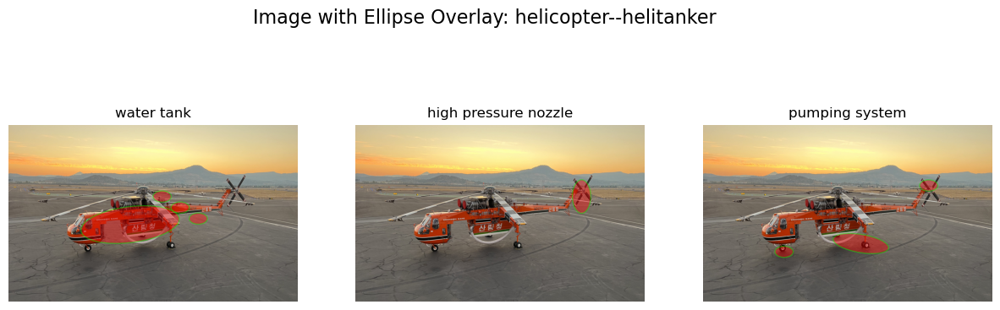

__________________________________________________________
Processing image: kitchen--peeler-1.jpg
Concept name:  kitchen--peeler
Concept kitchen : peeler is in the concept parts


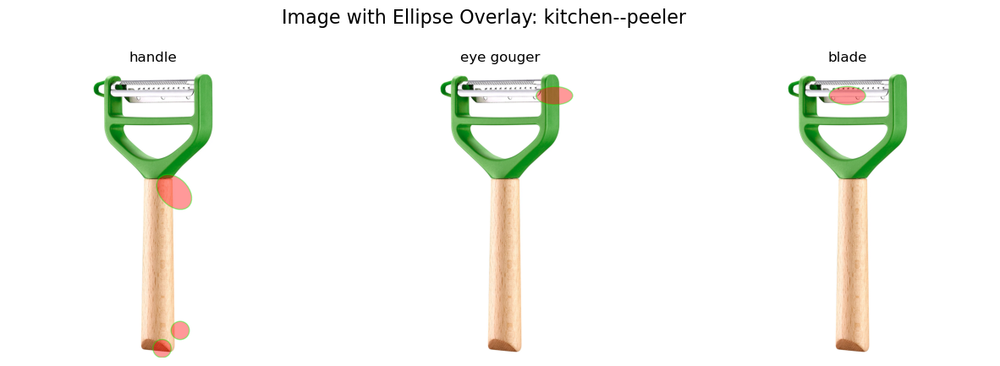

__________________________________________________________
Processing image: vehicles--suv-2.jpg
Concept name:  vehicles--suv
Concept vehicles : suv is in the concept parts


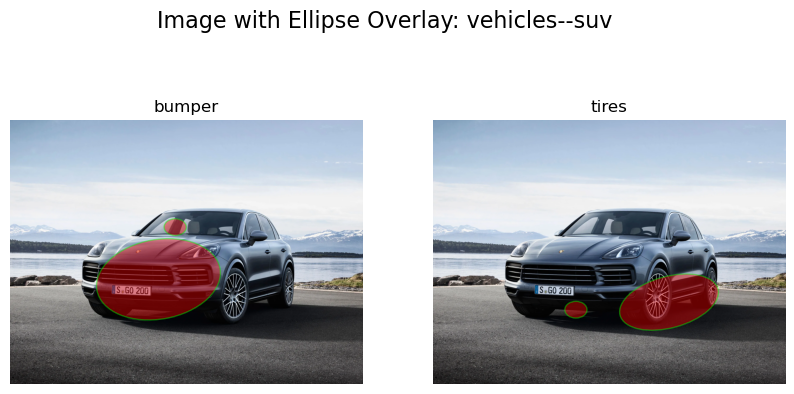

__________________________________________________________
Processing image: kitchen--garlic press-1.jpg
Concept name:  kitchen--garlic press
Prompt to GPT:  Which of the following parts are essential for identifying an garlic press specifically? Focus on parts that are visually distinctive and most critical to the garlic press's function. Only select the parts that you would use to describe the garlic press. If multiple parts seem similar, select the one most specific to most instances of garlic press concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {arm, mixing bowl, base, thumb lever, motor housing, gear, hose, cooking surface, pedestal, mouth, divider, rack, grating surface, aluminum sheet, oven rack, absorbent layer, label, compartment, prong, foot ring, jar, door, scoop bowl, bowl body, lever, cylindrical body, cavity, door handle, neck, surface, carafe, holes, cap l

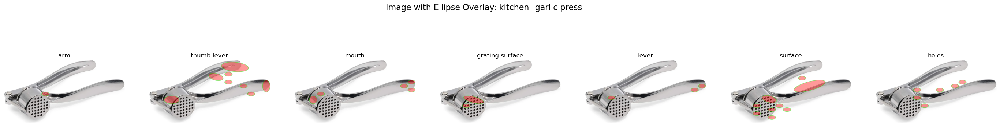

__________________________________________________________
Processing image: boats--destroyer-1.jpg
Concept name:  boats--destroyer
Concept boats : destroyer is in the concept parts


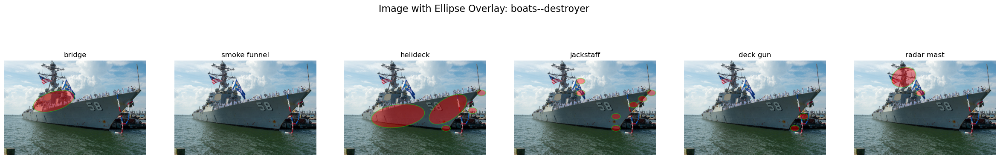

__________________________________________________________
Processing image: airplanes--attack-2.jpg
Concept name:  airplanes--attack
Concept airplanes : attack is in the concept parts


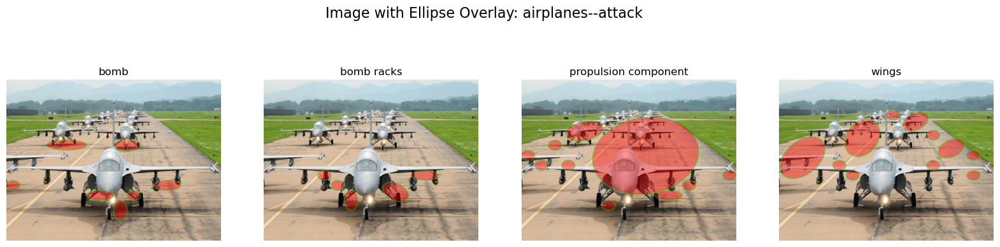

__________________________________________________________
Processing image: boats--banana boat-2.jpg
Concept name:  boats--banana boat
Concept boats : banana boat is in the concept parts


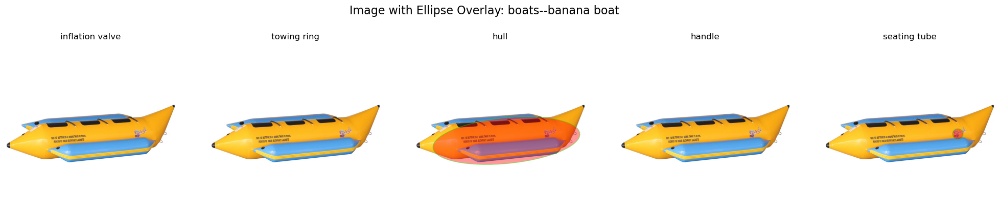

__________________________________________________________
Processing image: weapons--cruise missile-1.jpeg
Concept name:  weapons--cruise missile
Prompt to GPT:  Which of the following parts are essential for identifying an cruise missile specifically? Focus on parts that are visually distinctive and most critical to the cruise missile's function. Only select the parts that you would use to describe the cruise missile. If multiple parts seem similar, select the one most specific to most instances of cruise missile concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {pressure plate, guidance system, magazine, barrel, scabbard, launch tube, propeller, bolt, head, shaft, body, fuel tank, spine}


Filtered masks:  dict_keys(['guidance system', 'propeller', 'head', 'body', 'fuel tank'])


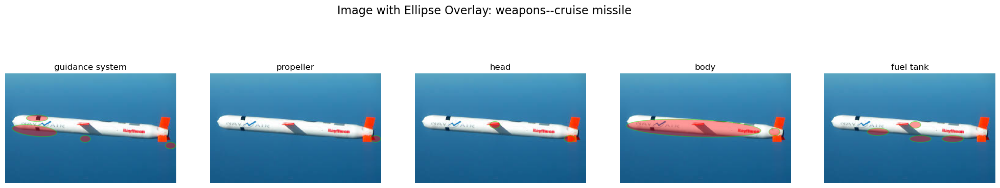

__________________________________________________________
Processing image: airplanes--supersonic passenger jet-2.jpg
Concept name:  airplanes--supersonic passenger jet
Prompt to GPT:  Which of the following parts are essential for identifying an supersonic passenger jet specifically? Focus on parts that are visually distinctive and most critical to the supersonic passenger jet's function. Only select the parts that you would use to describe the supersonic passenger jet. If multiple parts seem similar, select the one most specific to most instances of supersonic passenger jet concept. Provide only those for which you are more than 90% sure. Provide the output only as a comma-separated list of those critical less than 8 parts.
    Parts: {openable nose, propulsion component, fixed landing gear, wings, landing gear, row of windows, fire retardant}


Filtered masks:  dict_keys(['openable nose', 'propulsion component', 'wings'])


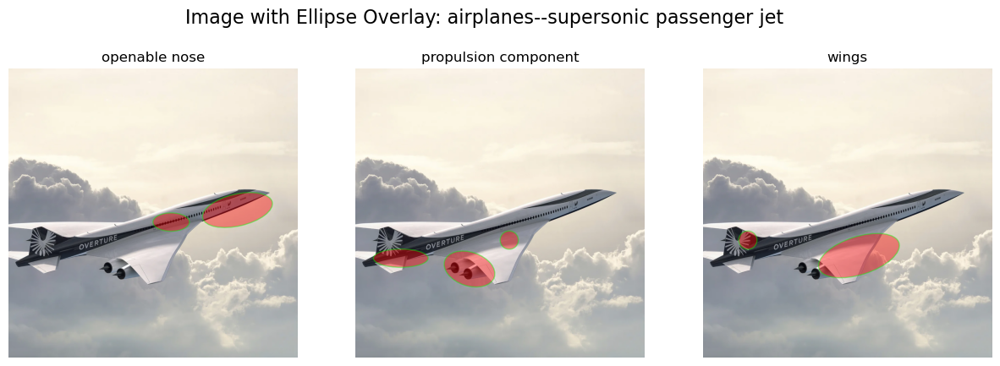

In [25]:

import copy
images_data_copy = copy.deepcopy(images_data)

for classifier in [part_classifier, part_classifier_l2]:
    print(f"Using classifier with penalty: {classifier.penalty}")
    print("__________________________________________________________")
    print("__________________________________________________________")
    # 1. if the concept is not in the concept_parts then it is a new concept
    # we should use root concept classifiers, we'll get part names from api call

    # 2. If the concept is in the concept_parts then we should get the parts from the concept_parts
    #  and use the concept classifiers
    images_data_copy = copy.deepcopy(images_data)
    for img_name, image_data in images_data_copy.items():
        print("__________________________________________________________")
        print(f"Processing image: {img_name}")
        image = image_data["image"]

        concept_name = image_data["concept"]
        print("Concept name: ", concept_name)
        root_concept = concept_name.split('--')[0]
        core_concept = concept_name.split('--')[1]

        # FOR TESTING PURPOSES
        # if root_concept not in classifier.classifers.keys(): # and concept_name not in part_classifier.classifers.keys():
        #     print(f"Skipping: {root_concept} : {concept_name} as the concept classifier is not trained yet")
        #     continue
        # print(f"Root concept: {root_concept}, core concept: {core_concept}")

        classifier.threshold = 0.9
        # CASE WHEN THE CONCEPT IS NEW
        if concept_name not in concept_parts:
            # we should use root concept classifiers - we'll get part names through api call
            image_data["concept"] = root_concept
            predicted_masks = classifier.classify_parts(image_data, root_concepts[root_concept])
            non_empty_masks = {}
            for part_msk in predicted_masks.keys():
                if predicted_masks[part_msk].max() > 0:
                    non_empty_masks[part_msk] = predicted_masks[part_msk]

            parts_to_consider = non_empty_masks.keys()
            # check if there are non empty masks for the parts
            if len(parts_to_consider) == 0:
                print(f"No parts found for new concept - {root_concept} : {core_concept}")
                continue

            parts_to_consider = ', '.join([s.replace("'", "") for s in parts_to_consider])
            # API CALL
            try:
                result = filter_relevant_parts_through_api(parts_to_consider, core_concept)
            except:
                print("Error in API call")
                continue
            # the result is comma separated list of parts make it a list
            if result is str:
                result_lst = [part.strip() for part in result.split(',')]
            else:
                result_lst = result

            filtered_masks = {part_name: part_mask for part_name, part_mask in non_empty_masks.items() if part_name in result_lst}
            # make sure there are less than 8 masks, if there are more, get rid of those that have the lowest sum in the mask array
            print("Filtered masks: ", filtered_masks.keys())
            
            if len(filtered_masks) == 0:
                print(f"No parts found for new concept - {root_concept} : {core_concept}")
                continue
            if len(filtered_masks) > 8:
                sorted_masks = sorted(filtered_masks.items(), key=lambda x: x[1].sum())
                filtered_masks = {part_name: part_mask for part_name, part_mask in sorted_masks[:8]}
            try:
                visualizer.visualize_part_masks(image, img_name, filtered_masks, concept_name)
            except:
                print("Error in visualizing masks")
        else:
            # CASE WHEN THE CONCEPT IS NOT NEW
            print(f"Concept {root_concept} : {core_concept} is in the concept parts")
            predicted_masks = classifier.classify_parts(image_data, concept_parts[concept_name])
            visualizer.visualize_part_masks(image, img_name, predicted_masks, concept_name)